In [3]:
import geopandas as gpd
import pandas as pd
import numpy as np
import pygris

import matplotlib.pyplot as plt
import matplotlib.lines as mlines
import matplotlib.patches as mpatches
import contextily as cxtly

import datetime

import re

In [6]:
redlining = gpd.read_file('../data/shapes/mappinginequality.json').to_crs('EPSG:26916')
chicago = gpd.read_file('../data/shapes/chicago_boundaries.geojson').to_crs('EPSG:26916')
tracts = pygris.tracts(county='cook', state='il', cb=True, cache=True).to_crs('EPSG:26916')
crashes = pd.read_csv('../data/crash_data.csv')
crashes = gpd.GeoDataFrame(crashes, geometry=gpd.points_from_xy(x=crashes.longitude, y=crashes.latitude), crs='EPSG:4326').to_crs("EPSG:26916")

Using the default year of 2021
Using FIPS code '17' for input 'il'
Using FIPS code '031' for input 'cook'


In [7]:
chicago.head()

,community,area,shape_area,perimeter,area_num_1,area_numbe,comarea_id,comarea,shape_len,geometry
0,DOUGLAS,0,46004621.1581,0,35,35,0,0,31027.0545098,"MULTIPOLYGON (((449429.813 4632712.182, 449429..."
1,OAKLAND,0,16913961.0408,0,36,36,0,0,19565.5061533,"MULTIPOLYGON (((450818.899 4629619.879, 450806..."
2,FULLER PARK,0,19916704.8692,0,37,37,0,0,25339.0897503,"MULTIPOLYGON (((447763.097 4627972.082, 447763..."
3,GRAND BOULEVARD,0,48492503.1554,0,38,38,0,0,28196.8371573,"MULTIPOLYGON (((449609.917 4629615.480, 449610..."
4,KENWOOD,0,29071741.9283,0,39,39,0,0,23325.1679062,"MULTIPOLYGON (((450818.899 4629619.879, 450819..."


In [8]:
comm_area_covid = pd\
    .read_csv('../data/commarea_covid.csv')\
    .dropna()\
    .drop(['Layer'], axis=1)

comm_area_covid['Name'] = comm_area_covid['Name'].apply(lambda x: re.sub('\'', '', x.upper()))

comm_area_covid.head()

,Name,GEOID,CDCOVCR_2021
1,ROGERS PARK,1.0,6927.9
2,NORWOOD PARK,10.0,8581.1
3,JEFFERSON PARK,11.0,8810.5
4,FOREST GLEN,12.0,8901.6
5,NORTH PARK,13.0,7996.0


In [9]:
comm_area_data = pd\
    .read_csv('../data/commarea_cha.csv')\
    .rename({
        'VRBWP_2017-2021':'low_birthweight_p',
        'LDPP_2023'      :'lead_poisoning_p'
    }, axis=1)\
    .dropna()\
    .drop(['Layer', 'Longitude', 'Latitude'], axis=1)

comm_area_data['Name'] = comm_area_data['Name'].apply(lambda x: re.sub('\'', '', x.upper()))

In [10]:
chicago = chicago\
    .merge(comm_area_data, left_on='community', right_on='Name', how='inner')\
    .merge(comm_area_covid, left_on='community', right_on='Name', how='inner')
chicago.head()

,community,area,shape_area,perimeter,area_num_1,area_numbe,comarea_id,comarea,shape_len,geometry,Name_x,GEOID_x,low_birthweight_p,lead_poisoning_p,Name_y,GEOID_y,CDCOVCR_2021
0,DOUGLAS,0,46004621.1581,0,35,35,0,0,31027.0545098,"MULTIPOLYGON (((449429.813 4632712.182, 449429...",DOUGLAS,35.0,12.163509,0.8219178082,DOUGLAS,35.0,7909.6
1,OAKLAND,0,16913961.0408,0,36,36,0,0,19565.5061533,"MULTIPOLYGON (((450818.899 4629619.879, 450806...",OAKLAND,36.0,13.863636,0.0,OAKLAND,36.0,8903.3
2,FULLER PARK,0,19916704.8692,0,37,37,0,0,25339.0897503,"MULTIPOLYGON (((447763.097 4627972.082, 447763...",FULLER PARK,37.0,7.8014184,2.0,FULLER PARK,37.0,9489.4
3,GRAND BOULEVARD,0,48492503.1554,0,38,38,0,0,28196.8371573,"MULTIPOLYGON (((449609.917 4629615.480, 449610...",GRAND BOULEVARD,38.0,12.354949,0.5291005291,GRAND BOULEVARD,38.0,13930.7
4,KENWOOD,0,29071741.9283,0,39,39,0,0,23325.1679062,"MULTIPOLYGON (((450818.899 4629619.879, 450819...",KENWOOD,39.0,11.855104,0.8213552361,KENWOOD,39.0,7841.2


### Clean Shapefiles

In [11]:
redlining = redlining.sjoin(chicago[['geometry']]).reset_index(drop=True)
redlining = redlining[redlining['residential']] # only residential areas
redlining.drop('index_right', axis=1, inplace=True)

  STATEFP COUNTYFP TRACTCE              AFFGEOID        GEOID  NAME  \
0      17      031  230200  1400000US17031230200  17031230200  2302   
1      17      031  230200  1400000US17031230200  17031230200  2302   
2      17      031  230200  1400000US17031230200  17031230200  2302   
3      17      031  230200  1400000US17031230200  17031230200  2302   
4      17      031  230200  1400000US17031230200  17031230200  2302   

            NAMELSAD STUSPS   NAMELSADCO STATE_NAME LSAD   ALAND  AWATER  \
0  Census Tract 2302     IL  Cook County   Illinois   CT  214283       0   
1  Census Tract 2302     IL  Cook County   Illinois   CT  214283       0   
2  Census Tract 2302     IL  Cook County   Illinois   CT  214283       0   
3  Census Tract 2302     IL  Cook County   Illinois   CT  214283       0   
4  Census Tract 2302     IL  Cook County   Illinois   CT  214283       0   

                                            geometry grade  
0  POLYGON ((440836.466 4640428.242, 441104.949 4...   

<Axes: >

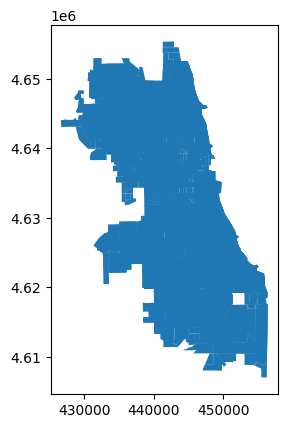

In [12]:
# Only keep tracts which intersect with the redlined areas
tracts = tracts.sjoin(redlining[['grade', 'geometry']]).reset_index(drop=True)
tracts.drop('index_right', axis=1, inplace=True)
print(tracts.head())
tracts.plot()

Crashes runs from 3/3/2013 to 5/6/2024

In [ ]:
y, m, d = '2022-07-08'.split('-')

In [13]:
# M, D, Y
def to_datetime(date_str: str, sep: str='/', nchar: int=-1) -> datetime.date:
    date_str = date_str[:nchar]
    y, m, d = date_str.split(sep)
    return datetime.date(int(y), int(m), int(d))

crashes['crash_date'] = crashes['crash_date'].apply(lambda x : to_datetime(x, '-', 10))

In [14]:
START_DATE = datetime.date(2023, 1, 1)
END_DATE = datetime.date(2023, 12, 31)

REL_ROWS = (crashes.crash_date <= END_DATE) & (crashes.crash_date >= START_DATE)

crashes = crashes[REL_ROWS].reset_index(drop=True)
crashes

,Unnamed: 0,crash_record_id,crash_date,posted_speed_limit,traffic_control_device,device_condition,weather_condition,lighting_condition,first_crash_type,trafficway_type,...,injuries_total,injuries_fatal,injuries_incapacitating,injuries_non_incapacitating,injuries_reported_not_evident,injuries_no_indication,injuries_unknown,latitude,longitude,geometry
0,85543,9f33be6bff3923ab957886c9cafc6c097322c46d385f1b...,2023-12-31,30,NO CONTROLS,NO CONTROLS,RAIN,"DARKNESS, LIGHTED ROAD",PARKED MOTOR VEHICLE,DIVIDED - W/MEDIAN (NOT RAISED),...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,41.762206,-87.613072,POINT (449038.131 4623556.417)
1,85544,2548b7bae8e53a941f28d18ccbe0f444cc9bf3b2c3eaa1...,2023-12-31,5,NO CONTROLS,NO CONTROLS,UNKNOWN,UNKNOWN,PARKED MOTOR VEHICLE,OTHER,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,41.949844,-87.646875,POINT (446385.208 4644409.800)
2,85545,a83a8b4b3c0f2ae287fabeeb70066a1662ee311b394bff...,2023-12-31,25,NO CONTROLS,NO CONTROLS,CLEAR,"DARKNESS, LIGHTED ROAD",PARKED MOTOR VEHICLE,ONE-WAY,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,41.754100,-87.583518,POINT (451488.747 4622639.347)
3,85546,f3be89d0340e4c18cc21acf686ea99ba028fcbff311460...,2023-12-31,30,NO CONTROLS,NO CONTROLS,CLEAR,DARKNESS,FIXED OBJECT,NOT DIVIDED,...,1.0,0.0,1.0,0.0,0.0,0.0,0.0,41.846412,-87.694857,POINT (442315.278 4632957.158)
4,85547,2fd2bc0bc3f724fc9580cdfa77446aec2d59226b917b10...,2023-12-31,30,TRAFFIC SIGNAL,FUNCTIONING PROPERLY,CLEAR,"DARKNESS, LIGHTED ROAD",SIDESWIPE SAME DIRECTION,NOT DIVIDED,...,0.0,0.0,0.0,0.0,0.0,2.0,0.0,41.928688,-87.642485,POINT (446731.459 4642058.147)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
110732,696275,f1e38c926df32d7f39f4542a8946c36891e899948190f0...,2023-01-01,30,NO CONTROLS,NO CONTROLS,UNKNOWN,"DARKNESS, LIGHTED ROAD",PARKED MOTOR VEHICLE,NOT DIVIDED,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,41.909154,-87.630292,POINT (447726.443 4639881.799)
110733,696276,0e671ca4c1c802a337a6dd0334c6cbcbdf58f09d17d8f4...,2023-01-01,30,NO CONTROLS,NO CONTROLS,UNKNOWN,UNKNOWN,PARKED MOTOR VEHICLE,ONE-WAY,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,41.745661,-87.603955,POINT (449783.098 4621714.146)
110734,696277,258df4dedebe0503d6d4a7eda1f5e7217fea3ba2a9ffc2...,2023-01-01,30,TRAFFIC SIGNAL,FUNCTIONING PROPERLY,RAIN,"DARKNESS, LIGHTED ROAD",ANGLE,FOUR WAY,...,0.0,0.0,0.0,0.0,0.0,2.0,0.0,41.808098,-87.714291,POINT (440666.511 4628716.459)
110735,696278,aaf05cd611c13d565f754f8b86cec048cb2a23f6375baa...,2023-01-01,30,NO CONTROLS,NO CONTROLS,CLEAR,"DARKNESS, LIGHTED ROAD",PARKED MOTOR VEHICLE,ONE-WAY,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,41.891263,-87.746667,POINT (438057.445 4637972.883)


In [15]:
crashes = crashes[['posted_speed_limit', 'damage', 'injuries_total', 'injuries_fatal', 'injuries_incapacitating', 'injuries_non_incapacitating', 'geometry']]

Get HOLC injury data by redlined district:

In [16]:
crashes_injuries_by_holc = crashes.sjoin(redlining, predicate='within', how='right')

# Group by, do some cursed gymnastics to make this nicer
crashes_injuries_by_holc =\
    crashes_injuries_by_holc[['area_id', 'injuries_total', 'injuries_fatal', 'injuries_incapacitating', 'injuries_non_incapacitating']]\
    .groupby('area_id')\
    .aggregate(['mean', 'sum', 'median', 'var'])\
    .unstack()\
    .reset_index()

# Create our new variable names
crashes_injuries_by_holc['column'] = crashes_injuries_by_holc['level_0'] + '_' + crashes_injuries_by_holc['level_1']

# Finalize!
crashes_injuries_by_holc =\
    crashes_injuries_by_holc[['area_id', 'column', 0]]\
    .pivot(values=0, columns='column', index='area_id')\
    .reset_index()

crashes_injuries_by_holc

column,area_id,injuries_fatal_mean,injuries_fatal_median,injuries_fatal_sum,injuries_fatal_var,injuries_incapacitating_mean,injuries_incapacitating_median,injuries_incapacitating_sum,injuries_incapacitating_var,injuries_non_incapacitating_mean,injuries_non_incapacitating_median,injuries_non_incapacitating_sum,injuries_non_incapacitating_var,injuries_total_mean,injuries_total_median,injuries_total_sum,injuries_total_var
0,1145,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.100000,0.0,1.0,0.100000,0.200000,0.0,2.0,0.177778
1,1148,0.000000,0.0,0.0,0.000000,0.040000,0.0,2.0,0.039184,0.200000,0.0,10.0,0.326531,0.280000,0.0,14.0,0.368980
2,1149,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.115079,0.0,58.0,0.229275,0.158730,0.0,80.0,0.276942
3,1150,0.000000,0.0,0.0,0.000000,0.005155,0.0,1.0,0.005155,0.061856,0.0,12.0,0.099781,0.113402,0.0,22.0,0.152876
4,1151,0.000000,0.0,0.0,0.000000,0.028037,0.0,3.0,0.027508,0.112150,0.0,12.0,0.138247,0.214953,0.0,23.0,0.283548
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
343,1653,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000
344,1654,0.000000,0.0,0.0,0.000000,0.025424,0.0,3.0,0.024989,0.177966,0.0,21.0,0.233015,0.254237,0.0,30.0,0.379255
345,5652,0.000000,0.0,0.0,NaN,0.000000,0.0,0.0,NaN,0.000000,0.0,0.0,NaN,0.000000,0.0,0.0,NaN
346,5653,0.001698,0.0,2.0,0.001696,0.015280,0.0,18.0,0.021856,0.089983,0.0,106.0,0.119339,0.151104,0.0,178.0,0.203147


In [17]:
crash_speeds_by_holc = crashes[['posted_speed_limit', 'geometry']].sjoin(redlining, predicate='within', how='right')

crash_speeds_by_holc =\
    crash_speeds_by_holc[['area_id', 'posted_speed_limit']]\
    .groupby('area_id')\
    .aggregate(['sum', 'size'])\
    .unstack()\
    .reset_index()\
    .drop('level_0', axis=1)\
    .pivot(index='area_id', values=0, columns='level_1')\
    .reset_index()\
    .rename({'sum':'sum_of_speed_limits', 'size':'number_of_crashes'}, axis=1)

In [18]:
crashes_by_holc = pd.merge(crash_speeds_by_holc, crashes_injuries_by_holc, on='area_id', how='outer')
crashes_by_holc = crashes_by_holc.merge(redlining[['area_id', 'grade', 'residential', 'geometry']], on='area_id', how='outer')
crashes_by_holc = gpd.GeoDataFrame(crashes_by_holc, geometry=crashes_by_holc.geometry, crs='EPSG:26916')
crashes_by_holc.drop_duplicates(inplace=True)
crashes_by_holc.head()

,area_id,number_of_crashes,sum_of_speed_limits,injuries_fatal_mean,injuries_fatal_median,injuries_fatal_sum,injuries_fatal_var,injuries_incapacitating_mean,injuries_incapacitating_median,injuries_incapacitating_sum,...,injuries_non_incapacitating_median,injuries_non_incapacitating_sum,injuries_non_incapacitating_var,injuries_total_mean,injuries_total_median,injuries_total_sum,injuries_total_var,grade,residential,geometry
0,1145,10.0,250.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,1.0,0.100000,0.200000,0.0,2.0,0.177778,C,True,"MULTIPOLYGON (((442482.018 4655190.501, 442500..."
1,1148,50.0,1450.0,0.0,0.0,0.0,0.0,0.040000,0.0,2.0,...,0.0,10.0,0.326531,0.280000,0.0,14.0,0.368980,B,True,"MULTIPOLYGON (((443274.833 4652910.055, 442929..."
3,1149,504.0,13980.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,58.0,0.229275,0.158730,0.0,80.0,0.276942,B,True,"MULTIPOLYGON (((442849.088 4651344.520, 442849..."
5,1150,195.0,5491.0,0.0,0.0,0.0,0.0,0.005155,0.0,1.0,...,0.0,12.0,0.099781,0.113402,0.0,22.0,0.152876,B,True,"MULTIPOLYGON (((442849.088 4651344.520, 442854..."
6,1151,107.0,2830.0,0.0,0.0,0.0,0.0,0.028037,0.0,3.0,...,0.0,12.0,0.138247,0.214953,0.0,23.0,0.283548,B,True,"MULTIPOLYGON (((442841.452 4650808.272, 442849..."


In [19]:
crashes_by_holc['mean_posted_speed_limit'] = crashes_by_holc['sum_of_speed_limits'] / crashes_by_holc['number_of_crashes']

d = crashes_by_holc[['sum_of_speed_limits', 'number_of_crashes', 'grade']].groupby('grade').sum()
d['mean_speed_limit'] = d['sum_of_speed_limits'] / d['number_of_crashes']
d

,sum_of_speed_limits,number_of_crashes,mean_speed_limit
grade,,,
A,45685.0,1428.0,31.992297
B,352322.0,12510.0,28.163229
C,2817089.0,99329.0,28.361194
D,1858593.0,64781.0,28.690403


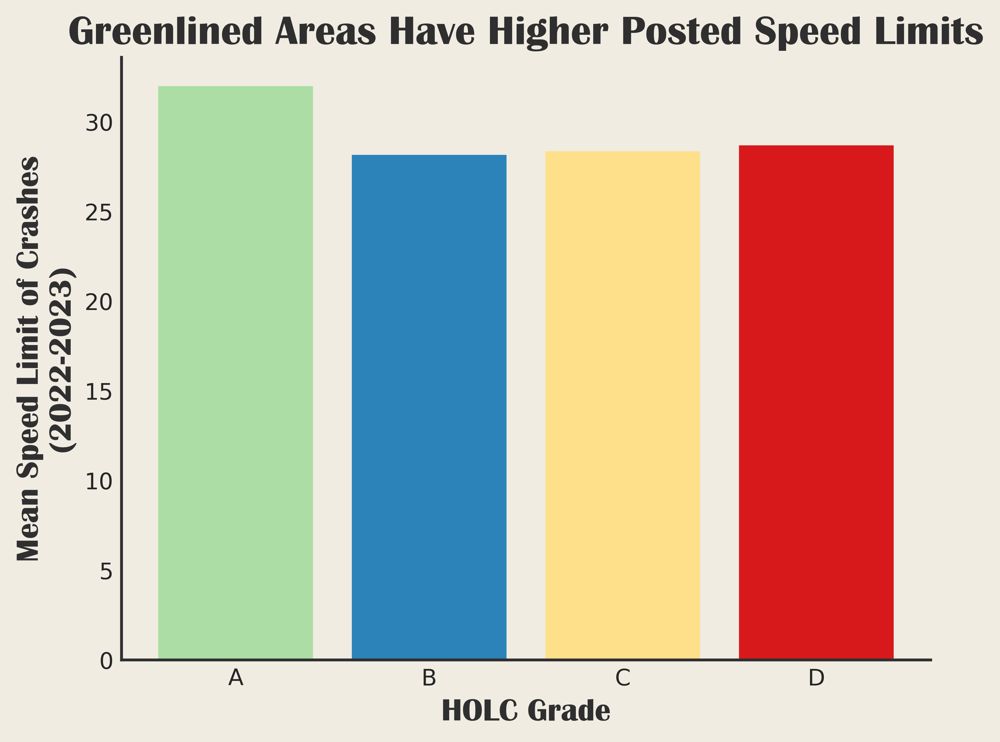

In [23]:
injuries = [31.99, 28.16, 28.36, 28.69]
grades = ['A', 'B', 'C', 'D']

with plt.style.context('seaborn-v0_8-white'):
    fig, ax = plt.subplots(dpi=600)
    ax.bar(grades, injuries, color=holc_colors.values())
    
    # Labels
    ax.set_title('Greenlined Areas Have Higher Posted Speed Limits', 
    **{
       'fontfamily':'Britannic Bold',
       'fontsize':18,
       'color':'#2f2f30'
    })

    ax.set_xlabel('HOLC Grade', **{
        'fontfamily':'Britannic Bold',
        'fontsize':14,
        'color':'#2f2f30'
    })
    ax.set_ylabel('Mean Speed Limit of Crashes\n(2022-2023)', **{
        'fontfamily':'Britannic Bold',
        'fontsize':14,
        'color':'#2f2f30'
    })
    
    # Spines
    ax.spines[['right', 'top']].set_visible(False)
    ax.spines[['left', 'bottom']].set_color('#2f2f30')
    
    ax.set_facecolor('#f0ece2')
    fig.set_facecolor('#f0ece2')
    

### Explore the fun dataset!

In [ ]:
crashes_by_holc[['grade', 'injuries_fatal_sum', 'injuries_incapacitating_sum', 'injuries_non_incapacitating_sum', 'number_of_crashes']]\
    .groupby('grade')\
    .median()\
    .rename({
        'injuries_fatal_sum'             :'median_fatal_injuries',
        'injuries_incapacitating_sum'    :'median_incapacitating_injuries',
        'injuries_non_incapacitating_sum':'median_non_incapacitating_injuries',
        'number_of_crashes'              :'median_n_crashes'
        }, axis=1)

,median_fatal_injuries,median_incapacitating_injuries,median_non_incapacitating_injuries,median_n_crashes
grade,,,,
A,0.0,2.0,10.0,136.0
B,0.0,2.0,12.0,116.0
C,0.0,5.0,33.0,288.0
D,0.0,4.5,37.0,278.5


In [21]:
holc_colors = {
    'A': "#abdda4",
    'B': "#2b83ba",
    'C': "#fee08b",
    'D': "#d7191c"
}

crashes_by_holc['color'] = crashes_by_holc['grade'].apply(lambda x: holc_colors[x])

(428017.09639523976, 457612.0854046671, 4606755.139898544, 4657692.879345997)

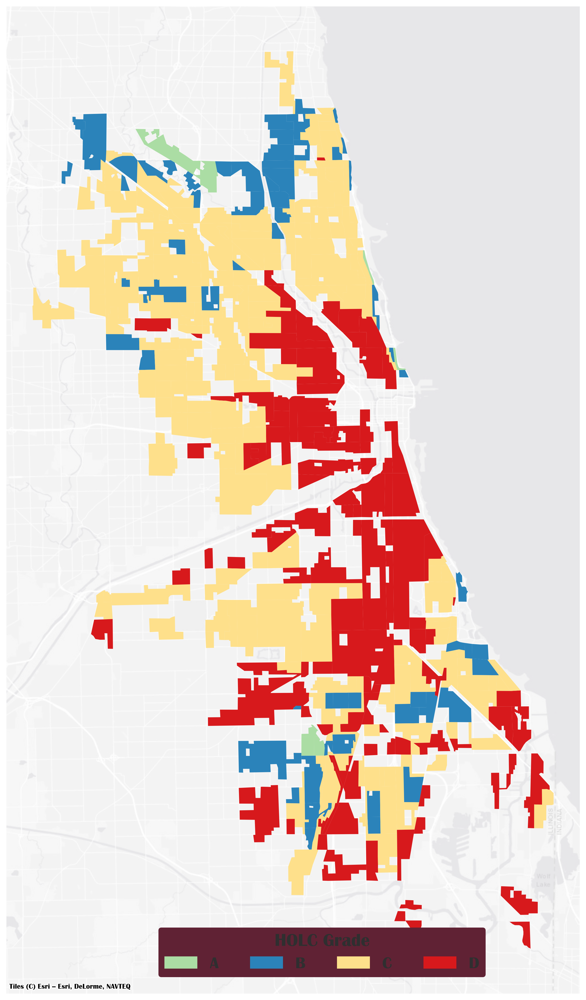

In [ ]:
plt.rc('font', family='Britannic Bold')

fig, ax = plt.subplots(figsize = (14, 20), dpi=300)

crashes_by_holc.plot(facecolor=crashes_by_holc['color'], ax=ax, alpha=1)
L = ax.legend(
        handles=[
            mpatches.Patch(color=holc_colors['A'], label='A'),
            mpatches.Patch(color=holc_colors['B'], label='B'),
            mpatches.Patch(color=holc_colors['C'], label='C'),
            mpatches.Patch(color=holc_colors['D'], label='D')
        ],
        title='HOLC Grade',
        alignment='center',
        bbox_to_anchor=(.85, .075),
        fontsize=18,
        title_fontsize=20,
        edgecolor='none',
        labelcolor='#2f2f30',
        facecolor='#602234',
        framealpha=1,
        ncol=4
    )

ax.add_artist(
    L
)

plt.setp(L.get_title(), color='#2f2f30')

cxtly.add_basemap(ax, crs="EPSG:26916", 
    source=cxtly.providers.Esri.WorldGrayCanvas,
    zoom=12, alpha=.5)

fig.set_facecolor('none')

ax.axis('off')

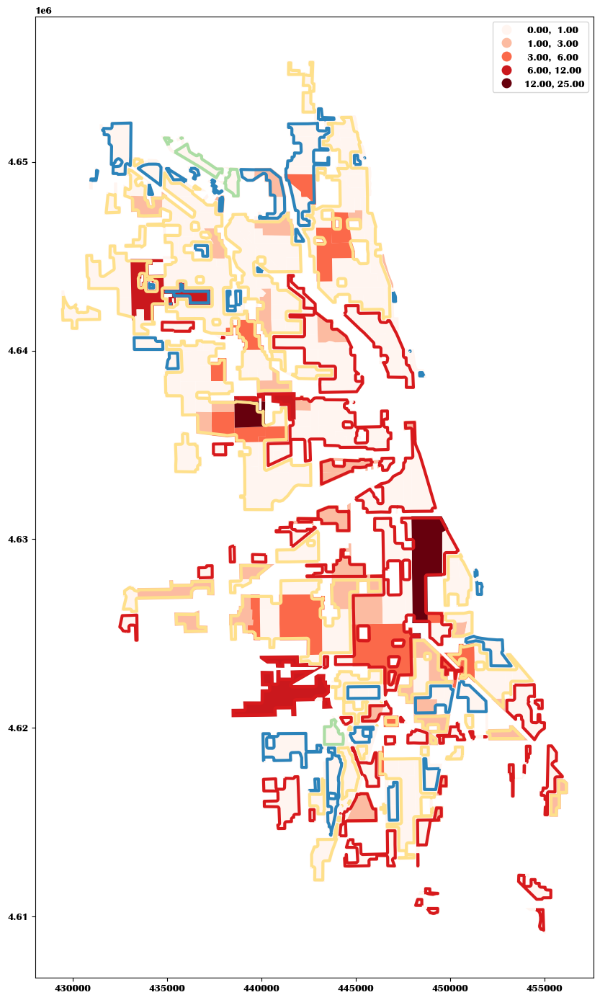

In [ ]:
d_grade = crashes_by_holc[crashes_by_holc['grade'] == 'D']
c_grade = crashes_by_holc[crashes_by_holc['grade'] == 'C']
b_grade = crashes_by_holc[crashes_by_holc['grade'] == 'B']
a_grade = crashes_by_holc[crashes_by_holc['grade'] == 'A']

fig, ax = plt.subplots(figsize = (10, 20))

crashes_by_holc.plot('injuries_fatal_sum', ax=ax, legend=True, scheme='fisherjenks', cmap='Reds')

for grade in [a_grade, b_grade, c_grade, d_grade]:
    grade.dissolve().buffer(-100).plot(
        ax=ax,
        edgecolor=grade['color'].values[0],
        facecolor='none',
        linewidth=-3
    )



<Axes: >

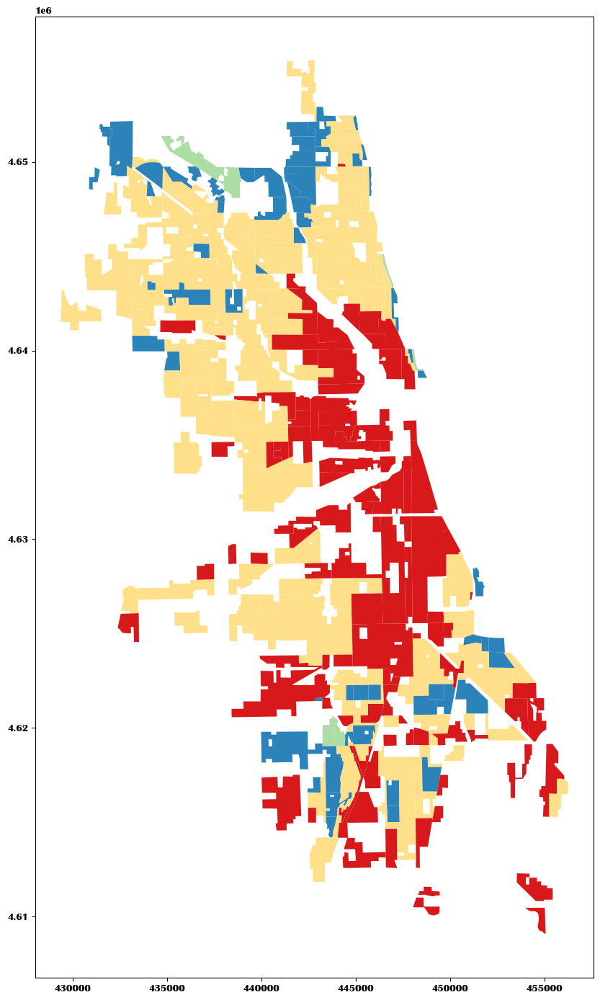

In [ ]:
fig, ax = plt.subplots(figsize=(10, 20))

DOTS_SCALE = 5

crashes_by_holc.plot(facecolor=crashes_by_holc['color'], ax=ax, alpha=1)
#crashes_by_holc.centroid.plot(markersize=DOTS_SCALE * crashes_by_holc['injuries_fatal_sum'], ax=ax, facecolor='black')


In [ ]:
crashes_by_holc['area'] = crashes_by_holc.area

crashes_by_holc['crashes_per_area'] = crashes_by_holc['number_of_crashes'] / (crashes_by_holc['area'] / (1000 ** 2))

crashes_by_holc['deaths_per_area'] = crashes_by_holc['injuries_fatal_sum'] / (crashes_by_holc['area'] / (1000 ** 2))

crashes_by_holc['injuries_per_area'] = crashes_by_holc['injuries_non_incapacitating_sum'] / (crashes_by_holc['area'] / (1000 ** 2))

In [ ]:
crashes_by_holc[['grade', 'injuries_fatal_sum', 'injuries_incapacitating_sum', 'injuries_non_incapacitating_sum', 'number_of_crashes', 'deaths_per_area', 'crashes_per_area', 'injuries_per_area']]\
    .groupby('grade')\
    .median()\
    .rename({
        'injuries_fatal_sum'              :'median_fatal_injuries',
        'injuries_incapacitating_sum'     :'median_incapacitating_injuries',
        'injuries_non_incapacitating_sum' :'median_non_incapacitating_injuries',
        'number_of_crashes'               :'median_n_crashes',
        'deaths_per_area'                 :'median_deaths_per_km',
        'crashes_per_area'                :'median_crashes_per_km',
        'injuries_per_area'               :'med_inj/area'
        }, axis=1)

,median_fatal_injuries,median_incapacitating_injuries,median_non_incapacitating_injuries,median_n_crashes,median_deaths_per_km,median_crashes_per_km,med_inj/area
grade,,,,,,,
A,0.0,2.0,10.0,136.0,0.0,89.199310,8.415029
B,0.0,2.0,12.0,116.0,0.0,202.024567,20.951439
C,0.0,5.0,33.0,288.0,0.0,341.948804,39.177324
D,0.0,4.5,37.0,278.5,0.0,313.819479,37.625092


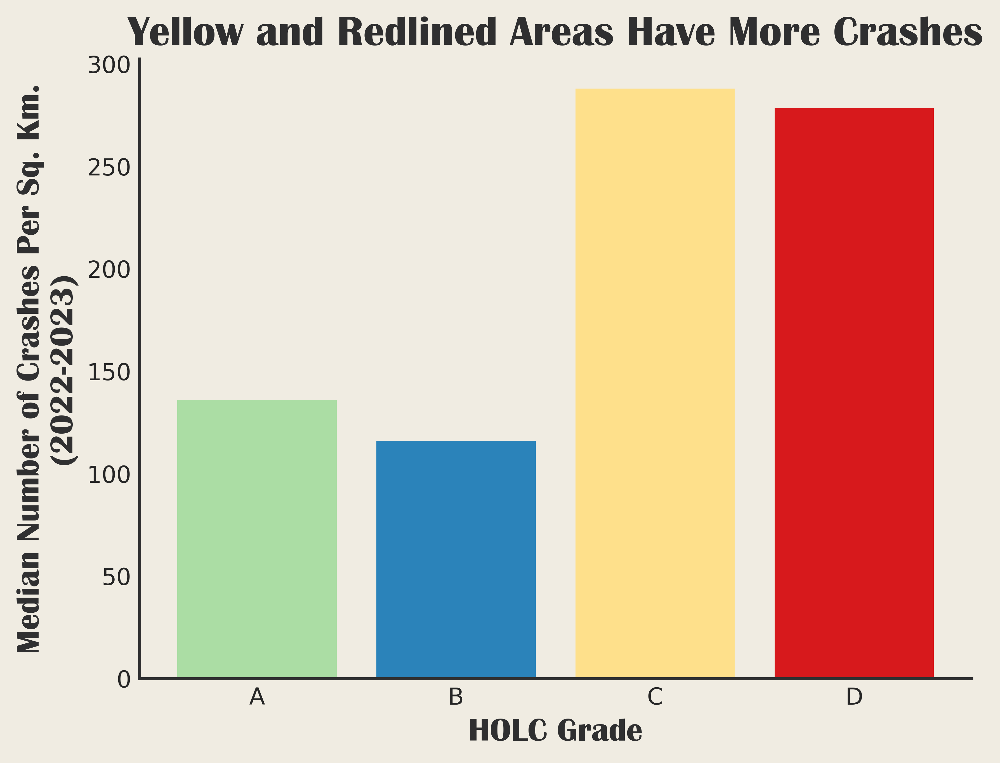

In [24]:
injuries = [136, 116, 288, 278.5]
grades = ['A', 'B', 'C', 'D']

with plt.style.context('seaborn-v0_8-white'):
    fig, ax = plt.subplots(dpi=600)
    ax.bar(grades, injuries, color=holc_colors.values())
    
    # Labels
    ax.set_title('Yellow and Redlined Areas Have More Crashes', 
    **{
       'fontfamily':'Britannic Bold',
       'fontsize':18,
       'color':'#2f2f30'
    })

    ax.set_xlabel('HOLC Grade', **{
        'fontfamily':'Britannic Bold',
        'fontsize':14,
        'color':'#2f2f30'
    })
    ax.set_ylabel('Median Number of Crashes Per Sq. Km.\n(2022-2023)', **{
        'fontfamily':'Britannic Bold',
        'fontsize':14,
        'color':'#2f2f30'
    })
    
    # Spines
    ax.spines[['right', 'top']].set_visible(False)
    ax.spines[['left', 'bottom']].set_color('#2f2f30')
    
    ax.set_facecolor('#f0ece2')
    fig.set_facecolor('#f0ece2')
    

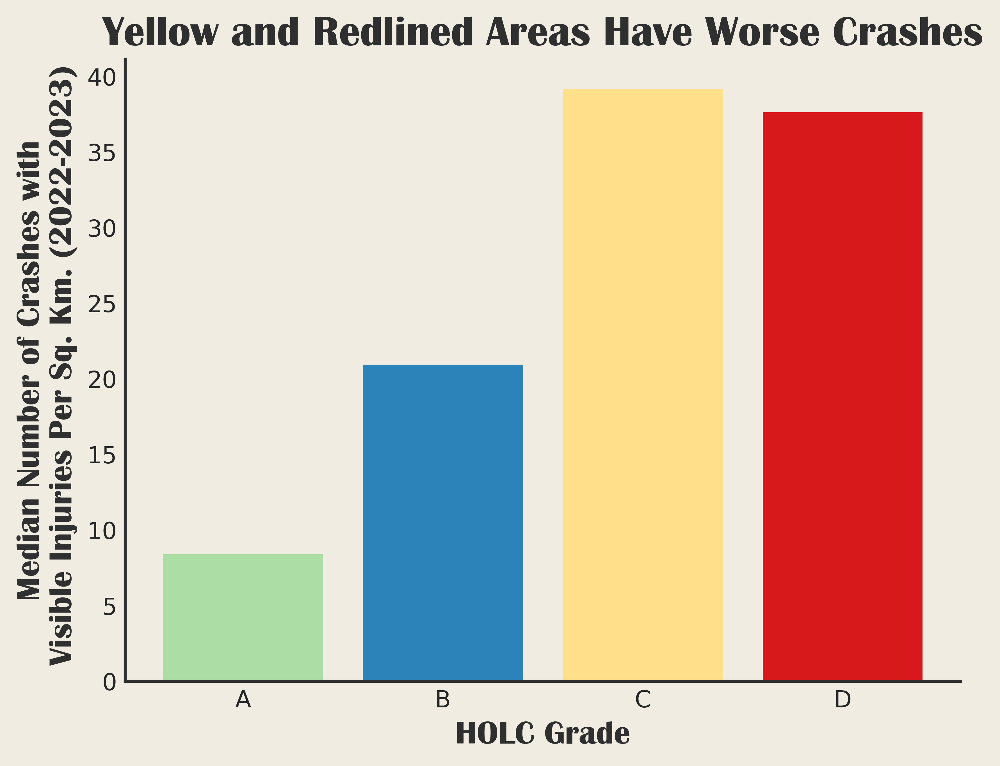

In [25]:
injuries = [8.41, 20.95, 39.18, 37.63]
grades = ['A', 'B', 'C', 'D']

with plt.style.context('seaborn-v0_8-white'):
    fig, ax = plt.subplots(dpi=600)
    ax.bar(grades, injuries, color=holc_colors.values())
    
    # Labels
    ax.set_title('Yellow and Redlined Areas Have Worse Crashes', 
    **{
       'fontfamily':'Britannic Bold',
       'fontsize':18,
       'color':'#2f2f30'
    })

    ax.set_xlabel('HOLC Grade', **{
        'fontfamily':'Britannic Bold',
        'fontsize':14,
        'color':'#2f2f30'
    })
    ax.set_ylabel('Median Number of Crashes with\n Visible Injuries Per Sq. Km. (2022-2023)', **{
        'fontfamily':'Britannic Bold',
        'fontsize':14,
        'color':'#2f2f30'
    })
    
    # Spines
    ax.spines[['right', 'top']].set_visible(False)
    ax.spines[['left', 'bottom']].set_color('#2f2f30')
    
    ax.set_facecolor('#f0ece2')
    fig.set_facecolor('#f0ece2')
    

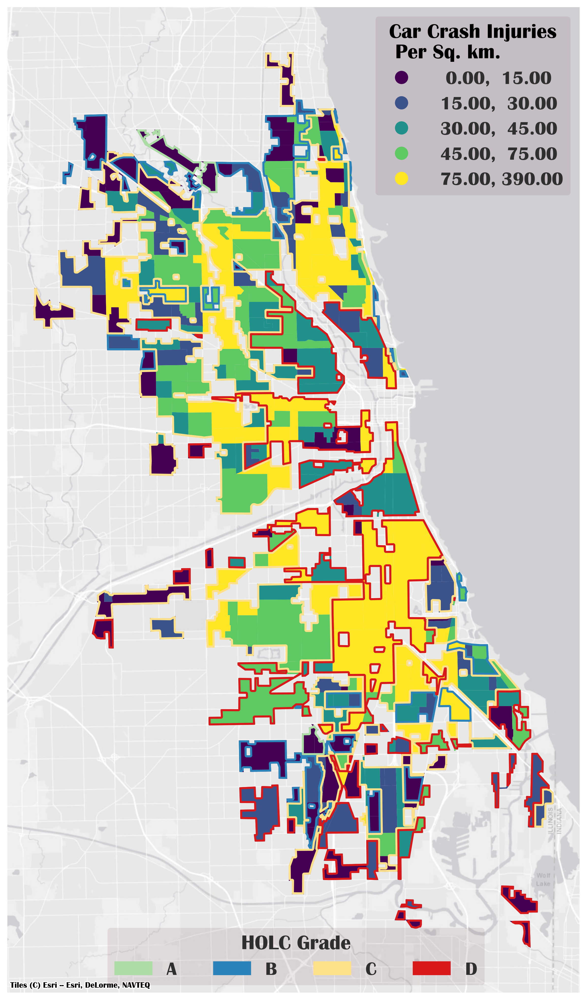

In [ ]:
d_grade = crashes_by_holc[crashes_by_holc['grade'] == 'D']
c_grade = crashes_by_holc[crashes_by_holc['grade'] == 'C']
b_grade = crashes_by_holc[crashes_by_holc['grade'] == 'B']
a_grade = crashes_by_holc[crashes_by_holc['grade'] == 'A']
plt.rc('font', family='Britannic Bold')


BUFFER_AMOUNT = -50
VARIABLE = 'injuries_per_area'


fig, ax = plt.subplots(figsize = (10, 20), dpi=300)

L = ax.legend(
        handles=[
            mpatches.Patch(color=holc_colors['A'], label='A'),
            mpatches.Patch(color=holc_colors['B'], label='B'),
            mpatches.Patch(color=holc_colors['C'], label='C'),
            mpatches.Patch(color=holc_colors['D'], label='D')
        ],
        title='HOLC Grade',
        alignment='center',
        bbox_to_anchor=(.85, .075),
        fontsize=18,
        title_fontsize=20,
        edgecolor='none',
        labelcolor='#2f2f30',
        facecolor='#602234',
        framealpha=.1,
        ncol=4
    )

ax.add_artist(
    L
)

plt.setp(L.get_title(), color='#2f2f30')

breaks = [15, 30, 45, 75, 390]
crashes_by_holc.plot(VARIABLE, ax=ax, legend=True,
    scheme='user_defined', classification_kwds={'bins':breaks}, 
    cmap='viridis', alpha=1,
    legend_kwds={
        'fontsize':18,
        'title_fontsize':20,
        'markerscale':1.29,
        'facecolor':'#602234',
        'framealpha':.1,
        'labelcolor':'#2f2f30',
        'alignment':'center'
    })

leg1 = ax.get_legend()
leg1.set_title('Car Crash Injuries\n Per Sq. km.')

for grade in [a_grade, b_grade, c_grade, d_grade]:
    grade.dissolve().buffer(BUFFER_AMOUNT).plot(
        ax=ax,
        edgecolor=grade['color'].values[0],
        facecolor='none',
        linewidth=2,
    )

cxtly.add_basemap(ax, crs="EPSG:26916", 
    source=cxtly.providers.Esri.WorldGrayCanvas,
    zoom=12, alpha=1)

fig.set_facecolor('none')

ax.axis('off')

plt.savefig('../figures/carcrashinjuries')

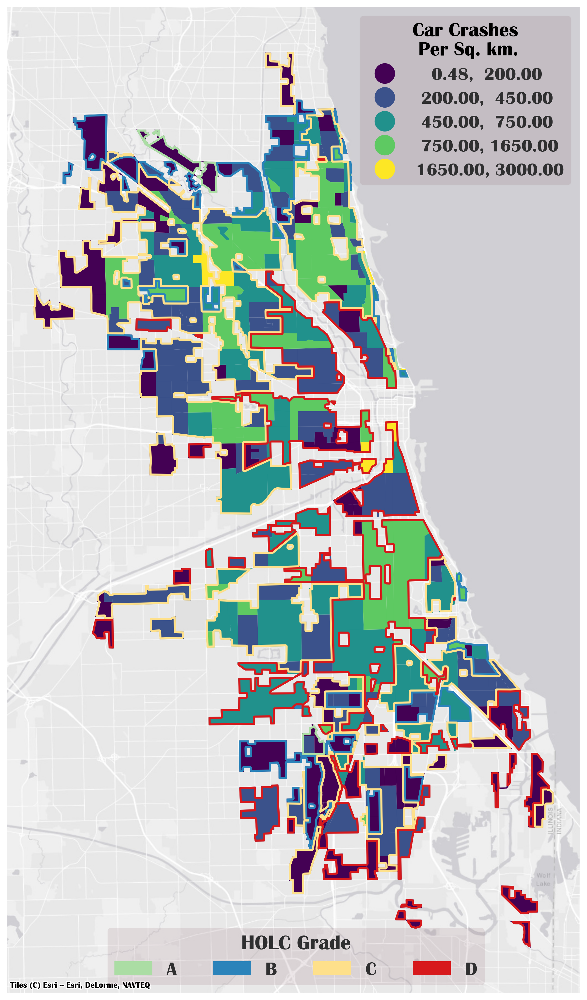

In [ ]:
d_grade = crashes_by_holc[crashes_by_holc['grade'] == 'D']
c_grade = crashes_by_holc[crashes_by_holc['grade'] == 'C']
b_grade = crashes_by_holc[crashes_by_holc['grade'] == 'B']
a_grade = crashes_by_holc[crashes_by_holc['grade'] == 'A']
plt.rc('font', family='Britannic Bold')


BUFFER_AMOUNT = -50
VARIABLE = 'crashes_per_area'

fig, ax = plt.subplots(figsize = (10, 20), dpi=300)

L = ax.legend(
        handles=[
            mpatches.Patch(color=holc_colors['A'], label='A'),
            mpatches.Patch(color=holc_colors['B'], label='B'),
            mpatches.Patch(color=holc_colors['C'], label='C'),
            mpatches.Patch(color=holc_colors['D'], label='D')
        ],
        title='HOLC Grade',
        alignment='center',
        bbox_to_anchor=(.85, .075),
        fontsize=18,
        title_fontsize=20,
        edgecolor='none',
        labelcolor='#2f2f30',
        facecolor='#602234',
        framealpha=.1,
        ncol=4
    )

ax.add_artist(
    L
)

plt.setp(L.get_title(), color='#2f2f30')

breaks = [200, 450, 750, 1650, 3000]
crashes_by_holc.plot(VARIABLE, ax=ax, legend=True,
    scheme='user_defined', classification_kwds={'bins':breaks}, 
    cmap='viridis', alpha=1,
    legend_kwds={
        'fontsize':17,
        'title_fontsize':19,
        'markerscale':2,
        'facecolor':'#602234',
        'framealpha':.1,
        'labelcolor':'#2f2f30',
        'alignment':'center'
    })

leg1 = ax.get_legend()
leg1.set_title('Car Crashes\n Per Sq. km.')

for grade in [a_grade, b_grade, c_grade, d_grade]:
    grade.dissolve().buffer(BUFFER_AMOUNT).plot(
        ax=ax,
        edgecolor=grade['color'].values[0],
        facecolor='none',
        linewidth=2,
    )

cxtly.add_basemap(ax, crs="EPSG:26916", 
    source=cxtly.providers.Esri.WorldGrayCanvas,
    zoom=12, alpha=1)

fig.set_facecolor('none')

ax.axis('off')

plt.savefig('../figures/crashespersqkm.png')

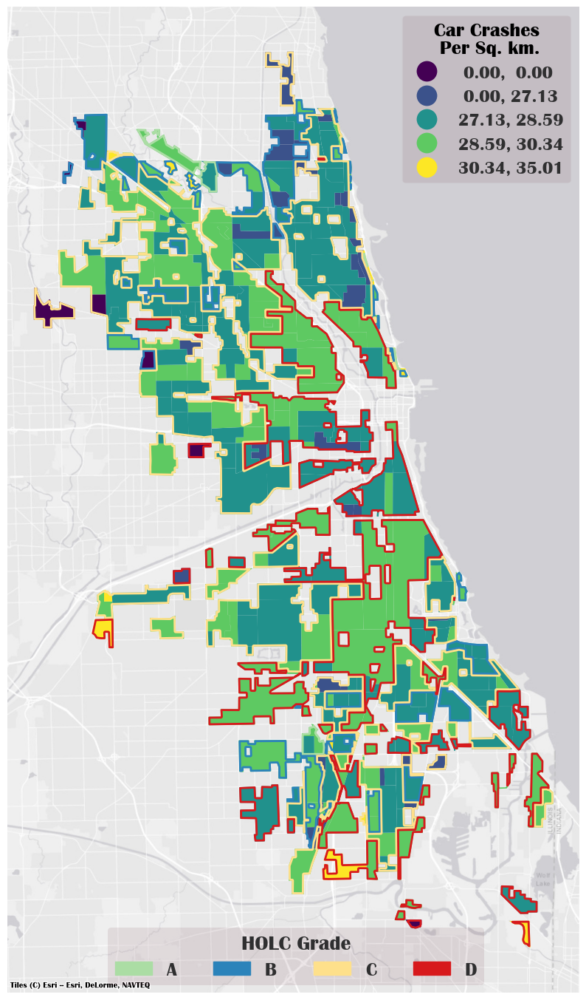

In [ ]:
d_grade = crashes_by_holc[crashes_by_holc['grade'] == 'D']
c_grade = crashes_by_holc[crashes_by_holc['grade'] == 'C']
b_grade = crashes_by_holc[crashes_by_holc['grade'] == 'B']
a_grade = crashes_by_holc[crashes_by_holc['grade'] == 'A']
plt.rc('font', family='Britannic Bold')


BUFFER_AMOUNT = -50
VARIABLE = 'mean_posted_speed_limit'

fig, ax = plt.subplots(figsize = (10, 20))#, dpi=300)

L = ax.legend(
        handles=[
            mpatches.Patch(color=holc_colors['A'], label='A'),
            mpatches.Patch(color=holc_colors['B'], label='B'),
            mpatches.Patch(color=holc_colors['C'], label='C'),
            mpatches.Patch(color=holc_colors['D'], label='D')
        ],
        title='HOLC Grade',
        alignment='center',
        bbox_to_anchor=(.85, .075),
        fontsize=18,
        title_fontsize=20,
        edgecolor='none',
        labelcolor='#2f2f30',
        facecolor='#602234',
        framealpha=.1,
        ncol=4
    )

ax.add_artist(
    L
)

plt.setp(L.get_title(), color='#2f2f30')

#breaks = [200, 450, 750, 1650, 3000]
crashes_by_holc.plot(VARIABLE, ax=ax, legend=True,
    scheme='natural_breaks', classification_kwds={'bins':breaks}, 
    cmap='viridis', alpha=1,
    legend_kwds={
        'fontsize':17,
        'title_fontsize':19,
        'markerscale':2,
        'facecolor':'#602234',
        'framealpha':.1,
        'labelcolor':'#2f2f30',
        'alignment':'center'
    })

leg1 = ax.get_legend()
leg1.set_title('Car Crashes\n Per Sq. km.')

for grade in [a_grade, b_grade, c_grade, d_grade]:
    grade.dissolve().buffer(BUFFER_AMOUNT).plot(
        ax=ax,
        edgecolor=grade['color'].values[0],
        facecolor='none',
        linewidth=2,
    )

cxtly.add_basemap(ax, crs="EPSG:26916", 
    source=cxtly.providers.Esri.WorldGrayCanvas,
    zoom=12, alpha=1)

fig.set_facecolor('none')

ax.axis('off')

plt.savefig('../figures/speedlimits.png')

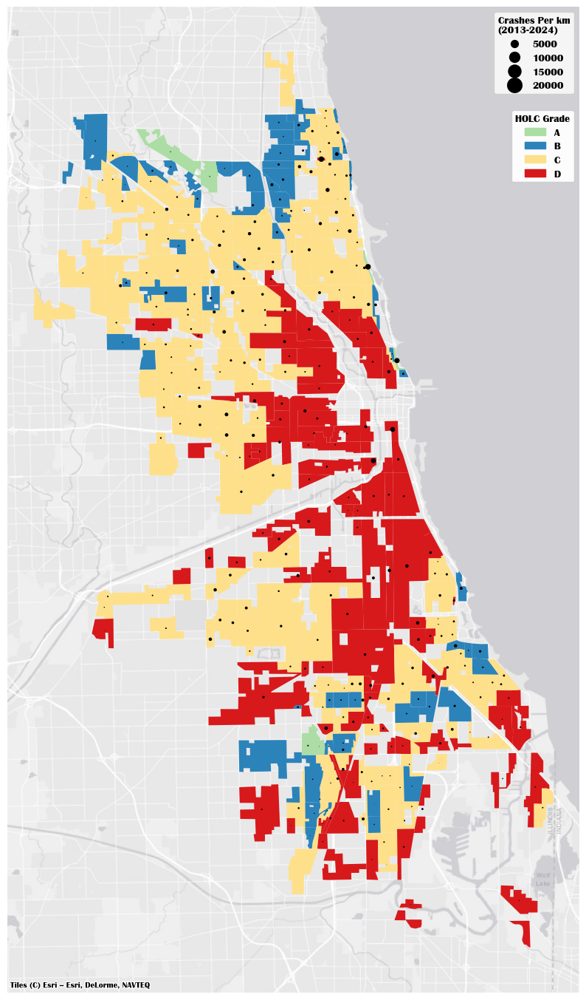

In [ ]:
fig, ax = plt.subplots(figsize=(10, 20))

DOTS_SCALE   = .01
DOT_COLOR    = 'black'
LEGEND_TITLE = 'Crashes Per km\n(2013-2024)'
VARIABLE = 'crashes_per_area'

crashes_by_holc.plot(facecolor=crashes_by_holc['color'], ax=ax, alpha=1)
crashes_by_holc.centroid.plot(markersize=(DOTS_SCALE * crashes_by_holc[VARIABLE]), ax=ax, facecolor=DOT_COLOR, edgecolor='none')
#chicago.dissolve().plot(ax=ax, alpha=.3, facecolor='none')

#_, bins = pd.cut((crashes_by_holc[VARIABLE] * DOTS_SCALE), bins=3, precision=10, retbins=True)
bins = np.array([50, 100, 150, 200]) / DOTS_SCALE
ax.add_artist(
    ax.legend(
        handles=[
            mlines.Line2D(
                [],
                [],
                color=DOT_COLOR,
                lw=0,
                marker="o",
                markersize=np.sqrt(b * DOTS_SCALE),
                label=str(int(b)),
            )
            for i, b in enumerate(bins)
        ],
        title=LEGEND_TITLE,
        alignment='center',
        loc=1,
    )
)

ax.add_artist(
    ax.legend(
        handles=[
            mpatches.Patch(color=holc_colors['A'], label='A'),
            mpatches.Patch(color=holc_colors['B'], label='B'),
            mpatches.Patch(color=holc_colors['C'], label='C'),
            mpatches.Patch(color=holc_colors['D'], label='D')
        ],
        title='HOLC Grade',
        alignment='center',
        loc='upper right',
        bbox_to_anchor=(1, .9)
    )
)

cxtly.add_basemap(ax, crs="EPSG:26916", 
    source=cxtly.providers.Esri.WorldGrayCanvas,
    zoom=12)

ax.axis('off')

plt.savefig('../figures/crashes_per_km.svg')

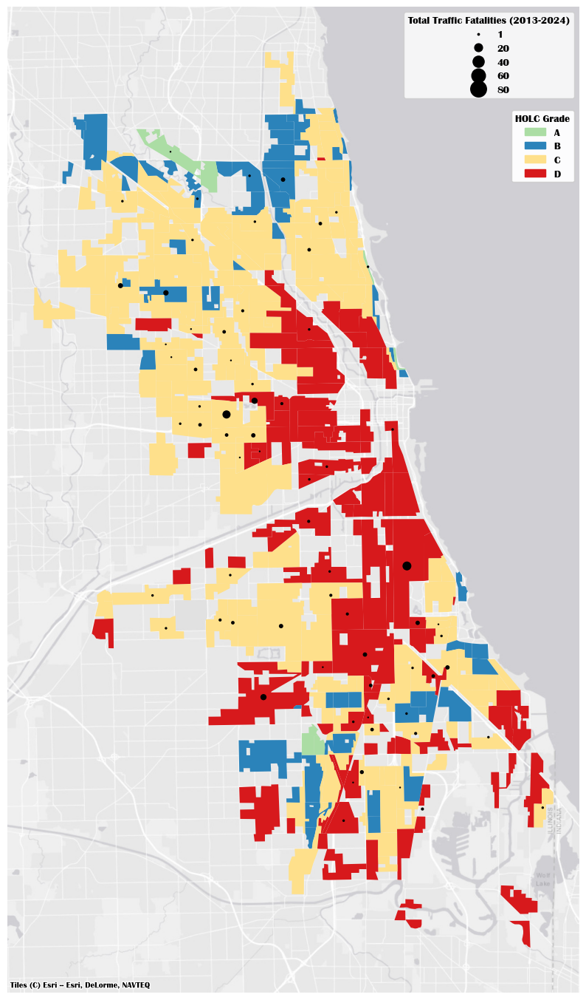

In [ ]:
fig, ax = plt.subplots(figsize=(10, 20))

DOTS_SCALE   = 3
DOT_COLOR    = 'black'
LEGEND_TITLE = 'Total Traffic Fatalities (2013-2024)'
VARIABLE = 'injuries_fatal_sum'

markersizes = crashes_by_holc[VARIABLE] * DOTS_SCALE

crashes_by_holc.plot(facecolor=crashes_by_holc['color'], ax=ax, alpha=1)
crashes_by_holc.centroid.plot(markersize=(markersizes), ax=ax, facecolor=DOT_COLOR, edgecolor='none')
#chicago.dissolve().plot(ax=ax, alpha=.3, facecolor='none')

#_, bins = pd.cut((crashes_by_holc[VARIABLE]), bins=3, precision=10, retbins=True)
bins = np.array([1, 20, 40, 60, 80])
ax.add_artist(
    ax.legend(
        handles=[
            mlines.Line2D(
                [],
                [],
                color=DOT_COLOR,
                lw=0,
                marker="o",
                markersize=np.sqrt(b * DOTS_SCALE),
                label=str(int(b)),
            )
            for i, b in enumerate(bins)
        ],
        title=LEGEND_TITLE,
        alignment='center',
        loc=1,
    )
)

ax.add_artist(
    ax.legend(
        handles=[
            mpatches.Patch(color=holc_colors['A'], label='A'),
            mpatches.Patch(color=holc_colors['B'], label='B'),
            mpatches.Patch(color=holc_colors['C'], label='C'),
            mpatches.Patch(color=holc_colors['D'], label='D')
        ],
        title='HOLC Grade',
        alignment='center',
        loc='upper right',
        bbox_to_anchor=(1, .9)
    )
)

cxtly.add_basemap(ax, crs="EPSG:26916", 
    source=cxtly.providers.Esri.WorldGrayCanvas,
    zoom=12)

ax.axis('off')

plt.savefig('../figures/crash_fatalities.svg')

In [ ]:
from sklearn.preprocessing import MinMaxScaler

#mspd = StandardScaler().fit_transform(crashes_by_holc['mean_speed_limit'].values.reshape(-1, 1))
#mspd = mspd - (2 * mspd.min())
mspd = MinMaxScaler((1, 20)).fit_transform(crashes_by_holc['mean_speed_limit'].values.reshape(-1, 1))
crashes_by_holc['mean_speed_limit_scaled'] = mspd

KeyError: 'mean_speed_limit'

In [ ]:
# mspd = ((crashes_by_holc['mean_speed_limit'] - crashes_by_holc['mean_speed_limit'].mean()) / crashes_by_holc['mean_speed_limit'].std())
# mspd = mspd - mspd.min()

AttributeError: PathCollection.set() got an unexpected keyword argument 'columns'

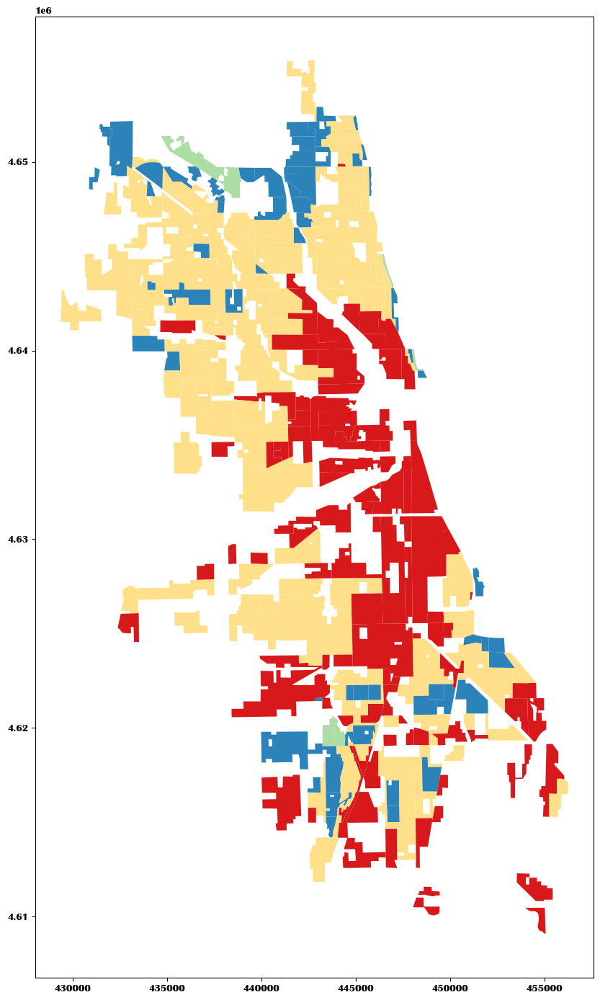

In [ ]:
fig, ax = plt.subplots(figsize=(10, 20))

DOTS_SCALE   = 1
DOT_COLOR    = 'black'
LEGEND_TITLE = 'Mean Speed Limit at Traffic Crashes (2013-2024)'
VARIABLE = 'mean_speed_limit_scaled'

markersizes = crashes_by_holc[VARIABLE] * DOTS_SCALE

crashes_by_holc.plot(facecolor=crashes_by_holc['color'], ax=ax, alpha=1)
crashes_by_holc.centroid.plot(markersize=(10), ax=ax, columns=crashes_by_holc[VARIABLE], edgecolor='none')
#chicago.dissolve().plot(ax=ax, alpha=.3, facecolor='none')

_, bins_sizes = pd.cut((crashes_by_holc[VARIABLE] * DOTS_SCALE), bins=3, precision=10, retbins=True)
_, bins_vals = pd.cut((crashes_by_holc['mean_speed_limit']), bins=3, precision=10, retbins=True)
#bins = np.array([1, 20, 40, 60, 80])
ax.add_artist(
    ax.legend(
        handles=[
            mlines.Line2D(
                [],
                [],
                color=DOT_COLOR,
                lw=0,
                marker="o",
                markersize=np.sqrt(b),
                label=str(int(bins_vals[i])),
            )
            for i, b in enumerate(bins_sizes)
        ],
        title=LEGEND_TITLE,
        alignment='center',
        loc=1,
    )
)

ax.add_artist(
    ax.legend(
        handles=[
            mpatches.Patch(color=holc_colors['A'], label='A'),
            mpatches.Patch(color=holc_colors['B'], label='B'),
            mpatches.Patch(color=holc_colors['C'], label='C'),
            mpatches.Patch(color=holc_colors['D'], label='D')
        ],
        title='HOLC Grade',
        alignment='center',
        loc='upper right',
        bbox_to_anchor=(1, .9)
    )
)

cxtly.add_basemap(ax, crs="EPSG:26916", 
    source=cxtly.providers.Esri.WorldGrayCanvas,
    zoom=12)

ax.axis('off')

#plt.savefig('../figures/med_speed.svg')

In [ ]:
redlining[['grade', 'fill']].value_counts()

new_fill = {

}

redlining['color'] = redlining['grade'].apply(lambda x: new_fill[x])

In [ ]:
redlining.fill

0      #abdda4
1      #abdda4
3      #abdda4
5      #abdda4
6      #abdda4
        ...   
615    #d7191c
616    #d7191c
618    #d7191c
620    #d7191c
624    #d7191c
Name: fill, Length: 348, dtype: object

(428017.09639523976, 457612.0854046671, 4606755.139898544, 4657692.879345997)

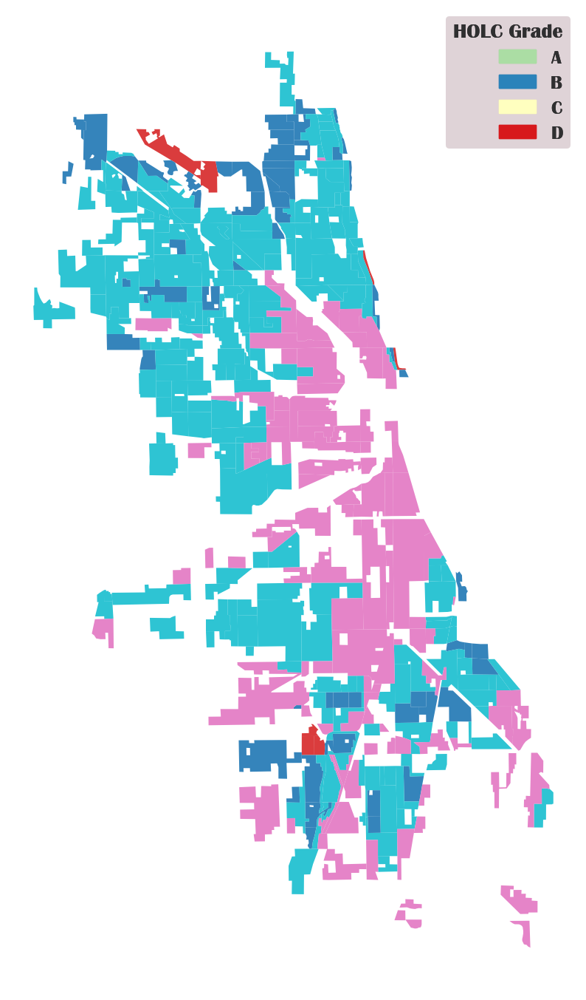

In [ ]:
fig, ax = plt.subplots(figsize=(10, 19))
plt.rc('font', family='Britannic Bold')

DOTS_SCALE   = .01
DOT_COLOR    = 'black'
LEGEND_TITLE = 'Crashes Per km\n(2013-2024)'
VARIABLE = 'crashes_per_area'

redlining = redlining.drop_duplicates()

redlining\
    .plot(redlining.color, ax=ax, alpha=.9)

L = ax.legend(
        handles=[
            mpatches.Patch(color=new_fill['A'], label='A'),
            mpatches.Patch(color=new_fill['B'], label='B'),
            mpatches.Patch(color=new_fill['C'], label='C'),
            mpatches.Patch(color=new_fill['D'], label='D')
        ],
        title='HOLC Grade',
        alignment='right',
        loc='upper right',
        bbox_to_anchor=(1, 1),
        fontsize=18,
        title_fontsize=20,
        edgecolor='none',
        labelcolor='#2f2f30',
        facecolor='#602234',
        framealpha=.1
    )

plt.setp(L.get_title(), color='#2f2f30')

ax.add_artist(
    L
)

# cxtly.add_basemap(ax, crs="EPSG:26916", 
#     source=cxtly.providers.Esri.WorldGrayCanvas,
#     zoom=12, alpha=.6)

ax.axis('off')

#plt.savefig('../figures/HOLC_reference.svg')

In [ ]:
chicago['low_birthweight_p'] = chicago['low_birthweight_p'].astype(np.float64)
chicago['lead_poisoning_p'] = chicago['lead_poisoning_p'].astype(np.float64)
chicago['CDCOVCR_2021'] = chicago['CDCOVCR_2021'].astype(np.float64)

(420417.6922849874, 458108.36631720874, 4608339.109813287, 4654661.445277648)

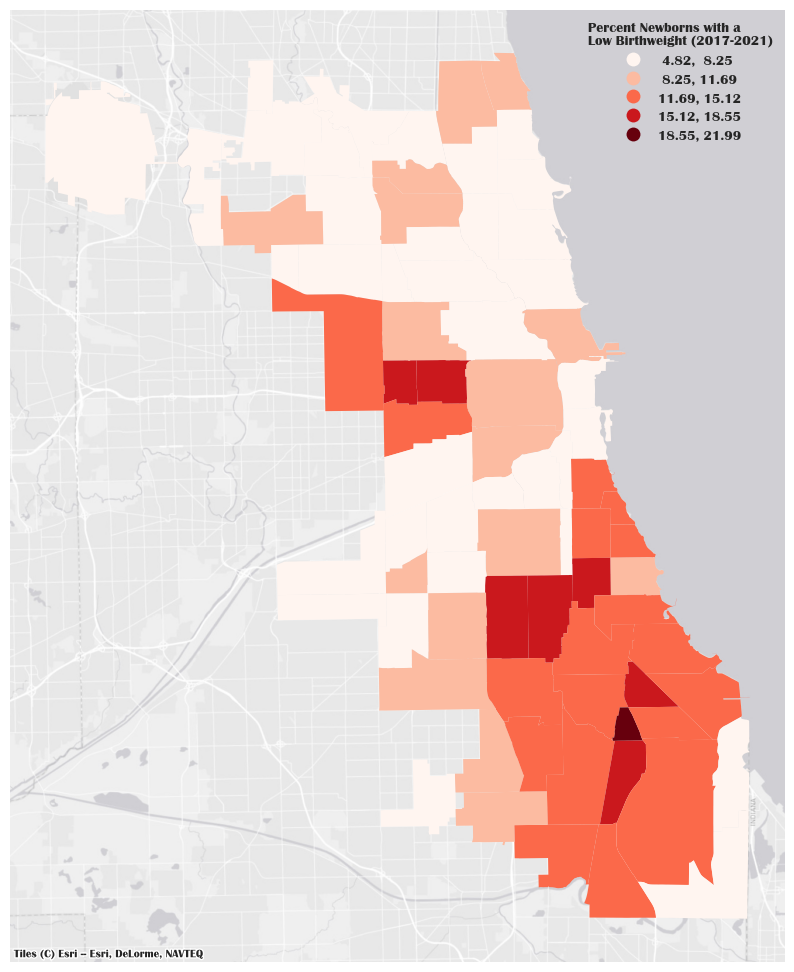

In [ ]:
fig, ax = plt.subplots(figsize=(10, 20))

VARIABLE = 'low_birthweight_p'
LEGEND_TITLE = 'Percent Newborns with a\nLow Birthweight (2017-2021)'
CMAP = 'Reds'
SCHEME = 'equalinterval'
K = 5

chicago.plot(VARIABLE, 
    scheme=SCHEME, k=K,
    cmap=CMAP,   ax=ax, legend=True)

leg1 = ax.get_legend()
leg1.set_title(LEGEND_TITLE)

cxtly.add_basemap(ax, crs="EPSG:26916", 
    source=cxtly.providers.Esri.WorldGrayCanvas,
    zoom=12)

ax.axis('off')

#plt.savefig('../figures/lowbirthweight.svg')

(420417.6922849874, 458108.36631720874, 4608339.109813287, 4654661.445277648)

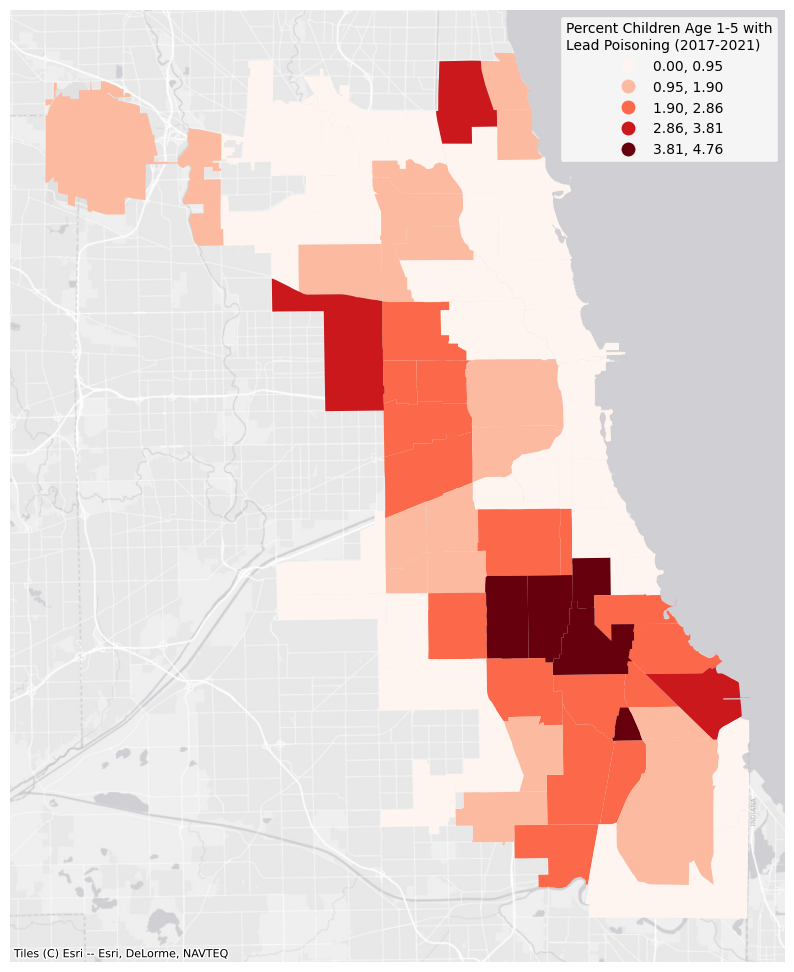

In [ ]:
fig, ax = plt.subplots(figsize=(10, 20))

VARIABLE = 'lead_poisoning_p'
LEGEND_TITLE = 'Percent Children Age 1-5 with\nLead Poisoning (2017-2021)'
CMAP = 'Reds'
SCHEME = 'equalinterval'
K = 5

chicago.plot(VARIABLE, 
                 scheme=SCHEME, k=K,
    cmap=CMAP,   ax=ax, legend=True)

leg1 = ax.get_legend()
leg1.set_title(LEGEND_TITLE)

cxtly.add_basemap(ax, crs="EPSG:26916", 
    source=cxtly.providers.Esri.WorldGrayCanvas,
    zoom=12)

ax.axis('off')

#plt.savefig('../figures/lead_poisoning.svg')

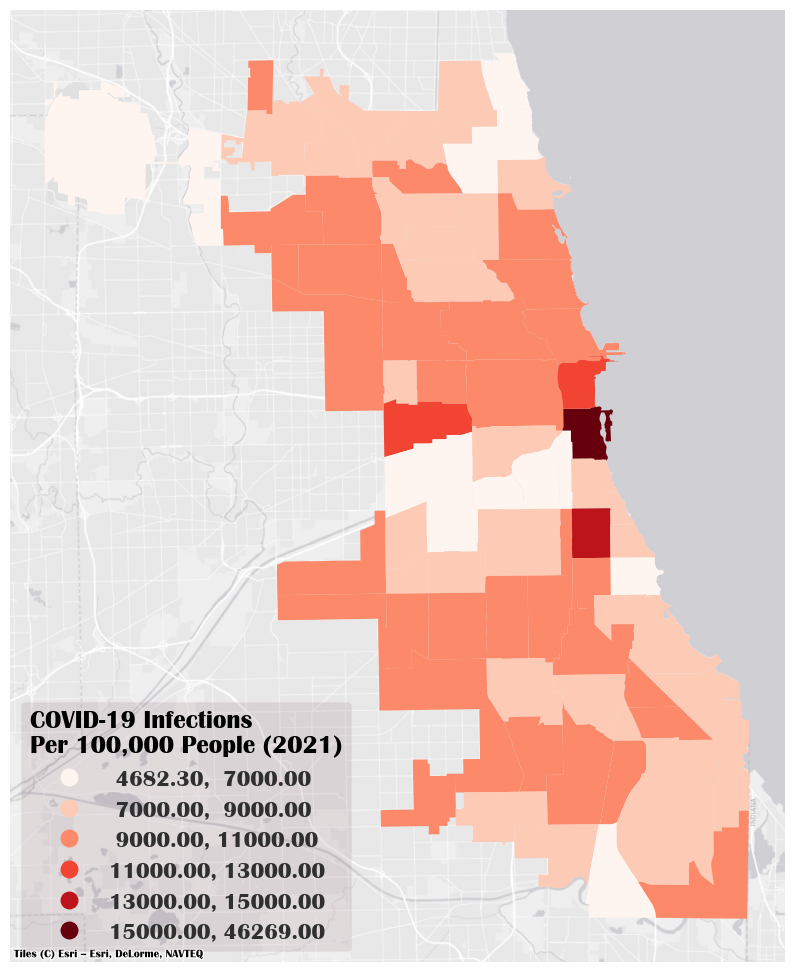

In [ ]:
fig, ax = plt.subplots(figsize=(10, 20))

VARIABLE = 'CDCOVCR_2021'
TITLE = 'COVID-19 Hit Red- and Yellowlined Areas Harder'
LEGEND_TITLE = 'COVID-19 Infections\nPer 100,000 People (2021)'
CMAP = 'Reds'
SCHEME = 'user_defined'
K = 5

bins = [int(7000), int(9000), int(11000), int(13000), int(15000)]
chicago.plot(VARIABLE, 
    scheme='user_defined', classification_kwds={'bins':bins}, k=K,
    cmap=CMAP,   ax=ax, legend=True, legend_kwds={
        'fontsize':16,
        'title_fontsize':18,
        'markerscale':1.29,
        'facecolor':'#602234',
        'framealpha':.1,
        'labelcolor':'#2f2f30',
        'alignment':'center'
    })

leg1 = ax.get_legend()
leg1.set_title(LEGEND_TITLE)
leg1.set_loc(3)

cxtly.add_basemap(ax, crs="EPSG:26916", 
    source=cxtly.providers.Esri.WorldGrayCanvas,
    zoom=12)

ax.axis('off')

plt.savefig('../figures/covid_rates.svg')

### Speed Camera Violations

In [ ]:
import datetime
violation_data = pd.read_csv('../data/Speed_Camera_Violations_20240510.csv')

In [ ]:
# M, D, Y
def to_datetime(date_str: str) -> datetime.date:
    m, d, y = date_str.split('/')
    return datetime.date(int(y), int(m), int(d))

violation_data['VIOLATION DATE'] = violation_data['VIOLATION DATE'].apply(to_datetime)

In [ ]:
START_DATE = datetime.date(2015, 1, 1)
END_DATE   = datetime.date(2020, 12, 31)

relevant_dates = (violation_data['VIOLATION DATE'] >= START_DATE) & (violation_data['VIOLATION DATE'] <= END_DATE)

violation_data = violation_data[relevant_dates]

violation_data.head()

,ADDRESS,CAMERA ID,VIOLATION DATE,VIOLATIONS,X COORDINATE,Y COORDINATE,LATITUDE,LONGITUDE,LOCATION
0,1111 N HUMBOLDT,CHI010,2015-04-10,67,NaN,NaN,NaN,NaN,NaN
1,1111 N HUMBOLDT,CHI010,2015-04-25,71,NaN,NaN,NaN,NaN,NaN
2,1111 N HUMBOLDT,CHI010,2015-04-14,38,NaN,NaN,NaN,NaN,NaN
3,1111 N HUMBOLDT,CHI010,2015-04-16,55,NaN,NaN,NaN,NaN,NaN
4,1111 N HUMBOLDT,CHI010,2015-04-24,54,NaN,NaN,NaN,NaN,NaN


Great. That's messy.

In [ ]:
violation_data[['LONGITUDE', 'LATITUDE']] = violation_data[['LONGITUDE', 'LATITUDE']].fillna(-999)

address_loc_pairs = {}

# Inefficient but works
for ind, row in violation_data.iterrows():
    # Initial update condition
    if not row['ADDRESS'] in address_loc_pairs:
        address_loc_pairs[row['ADDRESS']] = (row.LONGITUDE, row.LATITUDE)
    
    if address_loc_pairs[row['ADDRESS']] == (-999, -999):
        address_loc_pairs[row['ADDRESS']] = (row.LONGITUDE, row.LATITUDE)

# For robustness -- ensure our manually added values are sufficient.
for add, loc in address_loc_pairs.items():
    if loc == (-999, -999): print(add)

# values acquired from google earth pro (yipee!)
missing_adds = {
    '5520 S WESTERN' : (-87.684134, 41.791654),
    '7739 S WESTERN' : (-87.682752, 41.752004),
    '7738 S WESTERN' : (-87.683035, 41.751983),
    '5529 S WESTERN' : (-87.684157, 41.793476),
    '1111 N HUMBOLDT': (-87.702412, 41.902640)
}

# fix values
for ind, row in violation_data.iterrows():
    if row['ADDRESS'] in missing_adds:
        row['LATITUDE']  = missing_adds[row['ADDRESS']][1]
        row['LONGITUDE'] = missing_adds[row['ADDRESS']][0]

1111 N HUMBOLDT
5520 S WESTERN
7738 S WESTERN
5529 S WESTERN
7739 S WESTERN


In [ ]:
violation_data = gpd.GeoDataFrame(
    violation_data, 
    geometry=gpd.points_from_xy(
        violation_data.LONGITUDE, 
        violation_data.LATITUDE), 
    crs='EPSG:4326')\
        .to_crs('EPSG:26916')\
        .dropna()

In [ ]:

total_violations = violation_data[['CAMERA ID', 'VIOLATIONS']]\
    .groupby('CAMERA ID')\
    .mean()\
    .reset_index()

total_violations = total_violations\
    .merge(violation_data[['CAMERA ID', 'geometry']], on='CAMERA ID', how='left')\
    .drop_duplicates()

total_violations = gpd.GeoDataFrame(
    total_violations,
    geometry = total_violations.geometry,
    crs='EPSG:26916'
)

<Axes: >

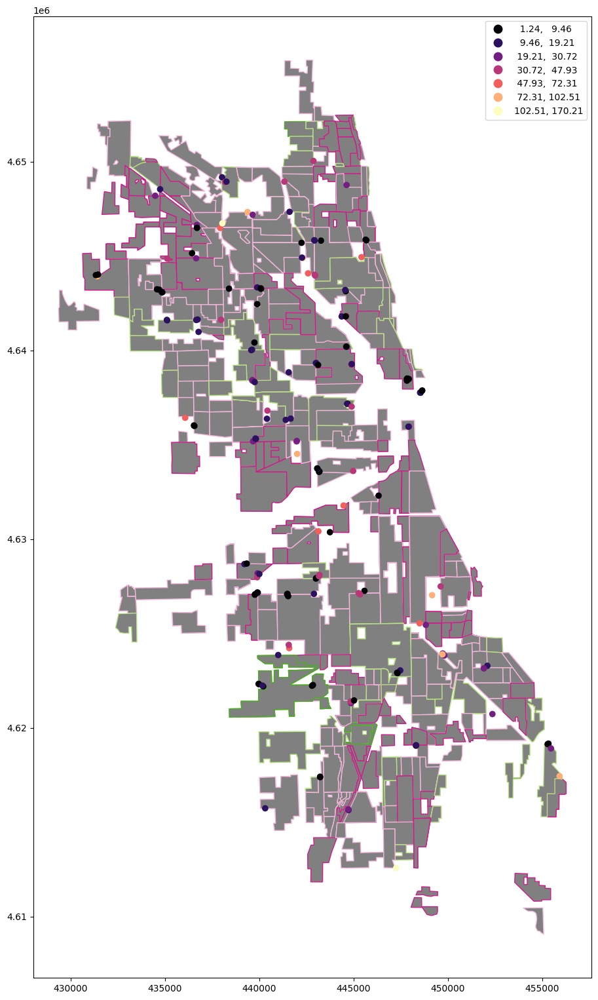

In [ ]:
fig, ax = plt.subplots(figsize=(11, 20))
redlining.plot(facecolor='grey', edgecolor=crashes_by_holc['color'], ax=ax, alpha=1)
total_violations.plot('VIOLATIONS', legend=True, scheme='naturalbreaks', k=7, ax=ax, cmap='magma')


C:\Users\wimer\AppData\Roaming\Python\Python311\site-packages\IPython\core\interactiveshell.py:3553: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  exec(code_obj, self.user_global_ns, self.user_ns)


KeyboardInterrupt: 

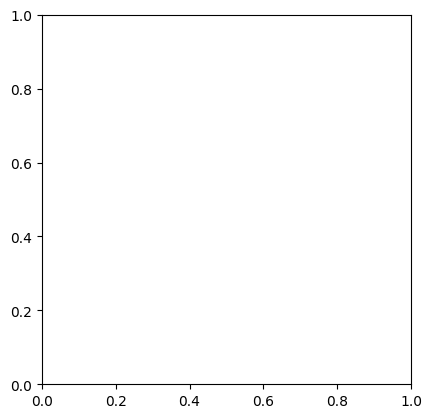

In [ ]:
violation_by_holc = redlining.sjoin(violation_data, op='contains')
violation_by_holc.plot('VIOLATIONS', legend=True, scheme='fisherjenks')